In [63]:
import numpy as np
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import re
import os, sys, email
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Plotting
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns; sns.set_style('whitegrid')
import wordcloud
import matplotlib
# Network analysis
import networkx as nx
import nxviz as nv
# NLP
from nltk.tokenize.regexp import RegexpTokenizer

import random 

# **DATA CLEANING AND PREPERATION**

In [64]:
rootdir = "../input/enron-email-dataset/emails.csv"
df = pd.read_csv(rootdir)   
df2 = pd.read_csv("../input/jobs-data/jobs.csv")

In [65]:
#Create Helper functions (From Zichen Wang's Kernel: Explore Enron)
def get_text_from_email(msg):
    parts = []
    for part in msg.walk():
        if part.get_content_type() == 'text/plain': #extracting text data
            parts.append(part.get_payload())
    return ''.join(parts)

def split_email_adds(line): #splitting email addresses
    if line:
        addrs = line.split(',')
        addrs = frozenset(map(lambda x : x.strip(), addrs))
    else:
        addrs = None
    return addrs

In [66]:
#create list of email objects
msgs = list(map(email.message_from_string, df['message']))
df.drop('message', axis=1, inplace=True) # axis = 1 used to apply a method across each row

# Get all fields from the email objects
fields = msgs[0].keys()
for field in fields:
    df[field] = [doc[field] for doc in msgs]
    
#parse content from emails
df['content'] = list(map(get_text_from_email, msgs))

# Split email address
df['From'] = df['From'].map(split_email_adds)
df['To'] = df['To'].map(split_email_adds)

#Extract the root of file as user
df['user'] = df['file'].map(lambda x:x.split('/')[0])
del msgs

df.head()

,file,Message-ID,Date,From,To,Subject,Mime-Version,Content-Type,Content-Transfer-Encoding,X-From,X-To,X-cc,X-bcc,X-Folder,X-Origin,X-FileName,content,user
0,allen-p/_sent_mail/1.,<18782981.1075855378110.JavaMail.evans@thyme>,"Mon, 14 May 2001 16:39:00 -0700 (PDT)",(phillip.allen@enron.com),(tim.belden@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Tim Belden <Tim Belden/Enron@EnronXGate>,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,Here is our forecast\n\n,allen-p
1,allen-p/_sent_mail/10.,<15464986.1075855378456.JavaMail.evans@thyme>,"Fri, 4 May 2001 13:51:00 -0700 (PDT)",(phillip.allen@enron.com),(john.lavorato@enron.com),Re:,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,John J Lavorato <John J Lavorato/ENRON@enronXg...,,,"\Phillip_Allen_Jan2002_1\Allen, Phillip K.\'Se...",Allen-P,pallen (Non-Privileged).pst,Traveling to have a business meeting takes the...,allen-p
2,allen-p/_sent_mail/100.,<24216240.1075855687451.JavaMail.evans@thyme>,"Wed, 18 Oct 2000 03:00:00 -0700 (PDT)",(phillip.allen@enron.com),(leah.arsdall@enron.com),Re: test,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Leah Van Arsdall,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,test successful. way to go!!!,allen-p
3,allen-p/_sent_mail/1000.,<13505866.1075863688222.JavaMail.evans@thyme>,"Mon, 23 Oct 2000 06:13:00 -0700 (PDT)",(phillip.allen@enron.com),(randall.gay@enron.com),,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Randall L Gay,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,"Randy,\n\n Can you send me a schedule of the s...",allen-p
4,allen-p/_sent_mail/1001.,<30922949.1075863688243.JavaMail.evans@thyme>,"Thu, 31 Aug 2000 05:07:00 -0700 (PDT)",(phillip.allen@enron.com),(greg.piper@enron.com),Re: Hello,1.0,text/plain; charset=us-ascii,7bit,Phillip K Allen,Greg Piper,,,\Phillip_Allen_Dec2000\Notes Folders\'sent mail,Allen-P,pallen.nsf,Let's shoot for Tuesday at 11:45.,allen-p


In [67]:
df2.head()

,eid,firstName,lastName,Email_id,Email2,Email3,EMail4,folder,status
0,13,Marie,Heard,marie.heard@enron.com,NaN,NaN,NaN,heard-m,NaN
1,6,Mark,Taylor,mark.e.taylor@enron.com,mark.taylor@enron.com,e.taylor@enron.com,NaN,taylor-m,Employee
2,19,Lindy,Donoho,lindy.donoho@enron.com,ldonoho@enron.com,NaN,NaN,donoho-l,Employee
3,115,Lisa,Gang,lisa.gang@enron.com,NaN,NaN,NaN,gang-l,NaN
4,129,Jeffrey,Skilling,jeff.skilling@enron.com,jeffrey.skilling@enron.com,NaN,NaN,skilling-j,CEO


# **ASSIGNING ROLES TO USERS**

In [68]:
a = pd.Series(df2.status.values,index=df2.folder).to_dict()        
df["status"] = df["user"].map(a)
df['status'].fillna(df.status.mode()[0],inplace = True)
df.status.unique()

array(['Manager', 'Vice President', 'Director', 'Employee', 'Trader',
       'CEO', 'In House Lawyer', 'Managing Director', 'President'],
      dtype=object)

#   SOCIAL NETWORK ANALYSIS

In [69]:
example_df = df.sample(frac = 1)[0:1000]

**PLOT OF NETWORK BETWEEN USERS IN SAMPLE**

In [70]:
G = nx.from_pandas_edgelist(example_df, 'user', 'To',create_using = nx.DiGraph())
print(nx.info(G))

Name: 
Type: DiGraph
Number of nodes: 880
Number of edges: 831
Average in degree:   0.9443
Average out degree:   0.9443


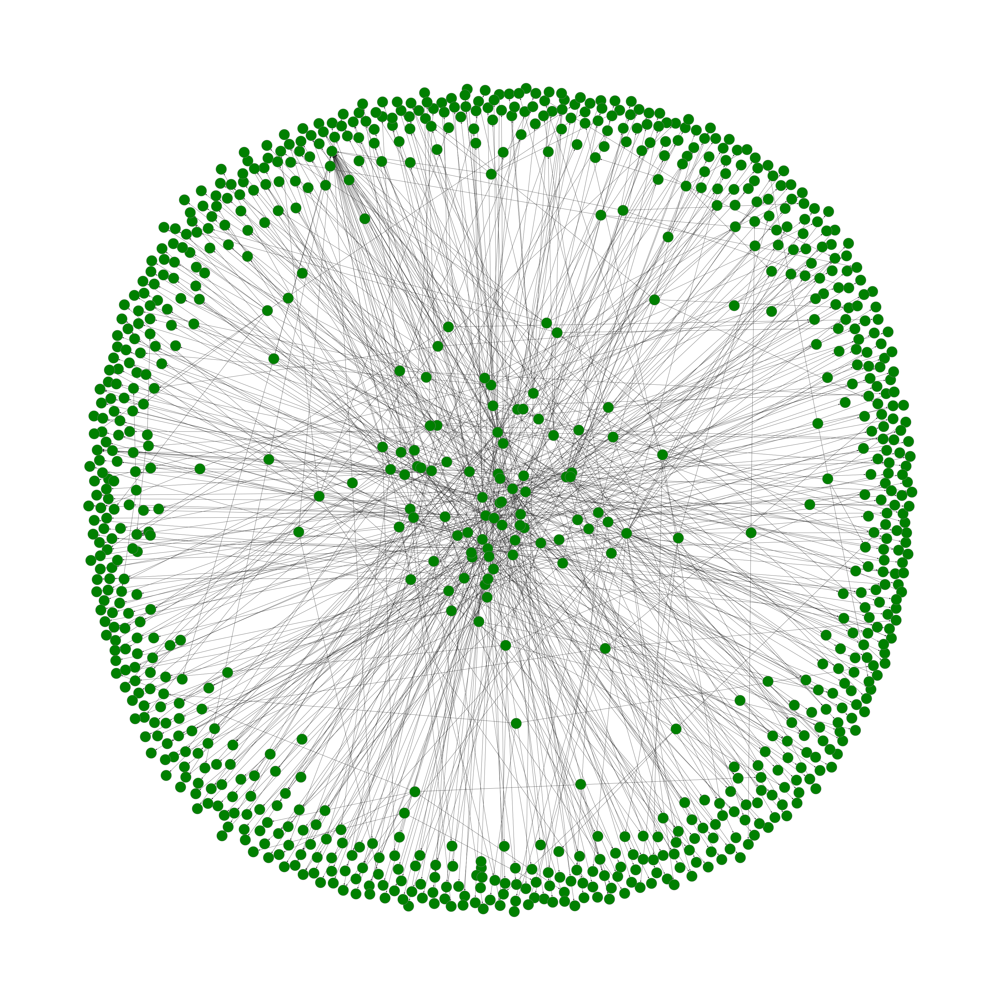

In [71]:
plt.figure(figsize=(50,50))
import matplotlib

cmap = matplotlib.colors.ListedColormap(['darkorange', 'lightgray', 'dodgerblue'])
nx.spring_layout(G)
nx.draw(G, with_labels=False, node_color="green", cmap=cmap, 
        node_size=1500, font_size=8, font_weight="bold", width=0.75, 
        edgecolors='gray')
plt.show()

**QUANTITIVE ANALYSIS BASED ON CONNECTION MEASURES: DEGREE CENTRALITY, BETWEENNESS CENTRALITY AND EIGENVECTOR CENTRALITY**

* Degree — the amount of neighbors of the node
* EigenVector  — iterative circles of neighbors
* Betweenness — the amount of short path going through the node

In [72]:
degree = {}
for user in example_df.user:
    if nx.degree(G, user) >=10:
        degree[user] = nx.degree(G, user)
  

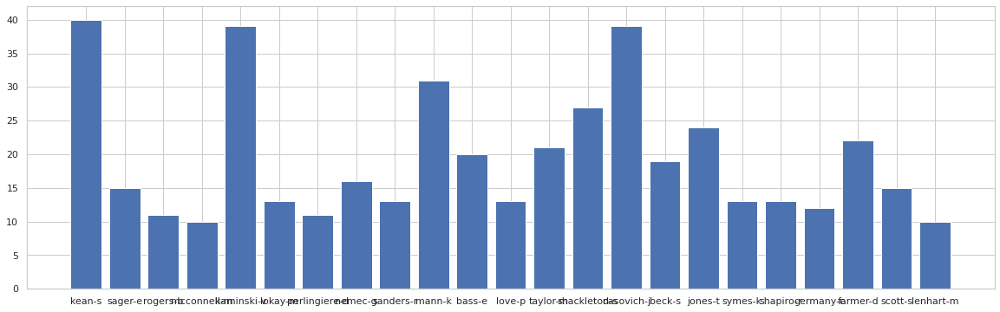

In [73]:
names = list(degree.keys())
values = list(degree.values())
plt.figure(figsize=(20,6))
plt.bar(range(len(degree)), values, tick_label=names)
plt.show()

In [74]:
clustering = {}
for node in G.nodes():
    if  nx.clustering(G, node) >=0:
        clustering[node] = nx.clustering(G, node)
    
Keymax = max(clustering, key=clustering.get)
print(Keymax)

kean-s


(-1.1998264378309251,
 1.2069313114881517,
 -1.20876643627882,
 1.1970188972353935)

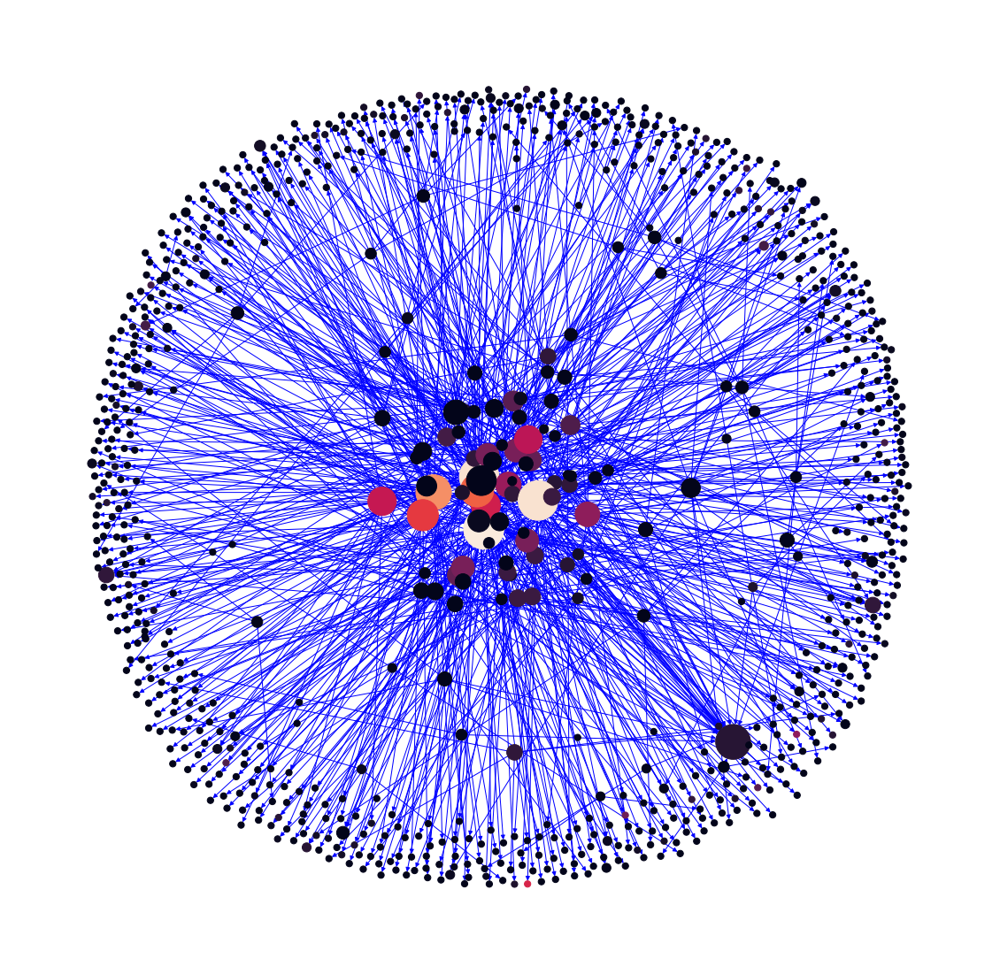

In [75]:
pos = nx.spring_layout(G)
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)


node_color = []
for v in G:
    a = nx.degree(G,v)
    if type(a)== int:
        node_color.append(200000.0*a)
node_color.append(200000.0*1)
        
node_size =  [v * 40000000 for v in betCent.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=node_size ,edge_color = "blue")
plt.axis('off')

In [76]:
eigCent = nx.eigenvector_centrality(G,max_iter = 1000)
degCent = nx.degree_centrality(G)

bc = sorted(betCent, key=betCent.get, reverse=True)[:5]
ec = sorted(eigCent, key=eigCent.get, reverse=True)[:5]
dc = sorted(degCent, key=degCent.get, reverse=True)[:5]

In [77]:
results = pd.DataFrame(list(zip(bc,ec,dc)),
               columns =['Betweenness Centrality', 'Eigenvector Centrality','Degree Centrality'])

In [78]:
results

,Betweenness Centrality,Eigenvector Centrality,Degree Centrality
0,kean-s,None,kean-s
1,kaminski-v,(all.worldwide@enron.com),kaminski-v
2,dasovich-j,(pete.davis@enron.com),dasovich-j
3,mann-k,(all.houston@enron.com),mann-k
4,None,(gerald.nemec@enron.com),None


FINDING MOST IMPORTANT PEOPLE IN NETWORK BASED ON BETWEENNESS CENTRALITY 

In [79]:
cent = nx.degree_centrality(new_G)
name = []
centrality = []

for key, value in cent.items():
    name.append(key)
    centrality.append(value)

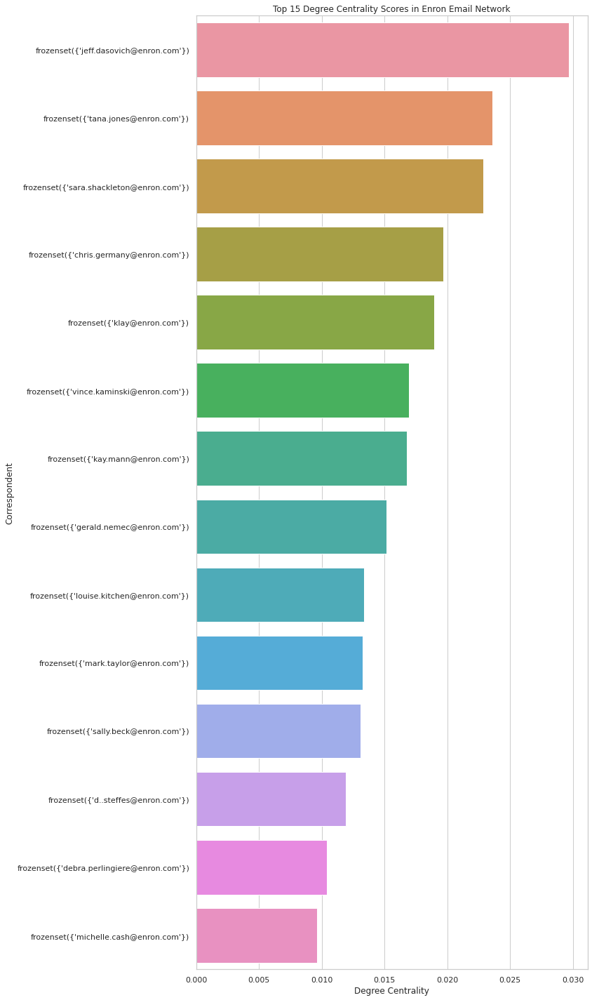

In [80]:
cent = pd.DataFrame()    
cent['name'] = name
cent['centrality'] = centrality
cent = cent.sort_values(by='centrality', ascending=False)

plt.figure(figsize=(10, 25))
_ = sns.barplot(x='centrality', y='name', data=cent[:15], orient='h')
_ = plt.xlabel('Degree Centrality')
_ = plt.ylabel('Correspondent')
_ = plt.title('Top 15 Degree Centrality Scores in Enron Email Network')
plt.show()

**ANALYSING RELATIONSHIPS BETWEEN SALARIES AND ROLES WITH MEASURES OF CONNECTIONS ON WHOLE DATA**

In [81]:
new_df = df[["From","user","status"]]
new_G = nx.from_pandas_edgelist(df, 'From', 'To',create_using = nx.DiGraph())

In [82]:
degree = []
for user in new_df.From:
    degree.append(100*nx.degree(new_G,user))

In [83]:
new_df["Degree"] = degree
new_df = new_df.drop_duplicates(subset = ["user"])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [84]:
eigCent_new = nx.eigenvector_centrality(new_G,max_iter = 1000)
e = []
for user in new_df.From:
    e.append(1000*eigCent_new[user])
    
new_df['eigenvector'] = e

Salary Approximations for users

* Vice President--$117K - $126K
* manager - 100K - 150K
* Director --$238K - $256K
* Employee - 50K -70K
* Trade - 100K-120K
* In House Lawyer - 97K-110K
* Managing Director - 240K - 260K
* President - 300K

In [85]:
salaries = []
for i in new_df["status"]:
    if i =="Manager":
        salaries.append(int(np.random.randint(100000, 150000,1)))
    if i =="Vice President":
        salaries.append(int(np.random.randint(117000, 126000,1)))
    if i =="Director":
        salaries.append(int(np.random.randint(238000, 256000,1)))
    if i =="Employee":
        salaries.append(int(np.random.randint(50000, 70000,1)))
    if i =="Trader":
        salaries.append(int(np.random.randint(100000, 120000,1)))
    if i =="In House Lawyer":
        salaries.append(int(np.random.randint(97000, 110000,1)))
    if i =="Managing Director":
        salaries.append(int(np.random.randint(240000, 260000,1)))
    if i =="CEO":
        salaries.append(int(np.random.randint(270000, 280000,1)))
    
    if i =="President":
        salaries.append(300000)    
        
new_df["salary"] = salaries

In [86]:
new_df.head()

,From,user,status,Degree,eigenvector,salary
0,(phillip.allen@enron.com),allen-p,Manager,22700,18.221140,116942
3034,(john.arnold@enron.com),arnold-j,Manager,44600,69.950865,133544
7932,(suresh.raghavan@enron.com),arora-h,Vice President,1000,3.466342,125402
8586,(robert.badeer@enron.com),badeer-r,Director,6800,12.085956,248404
9463,(project.gem@enron.com),bailey-s,Employee,300,1.583629,62328


**PLOTTING RELATIONSHIPS**

**------ SALARY VS DEGREE CENTRALITY**

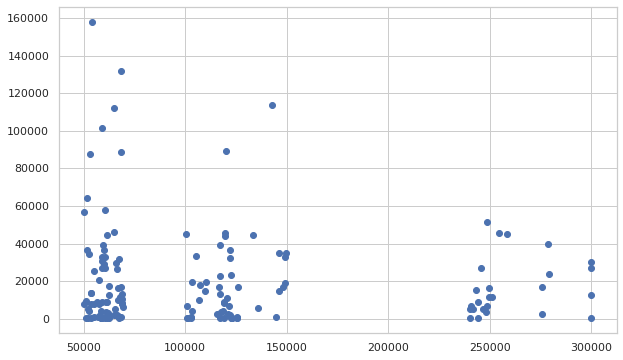

In [87]:
plt.figure(figsize=(10,6))
plt.scatter(new_df.salary,new_df.Degree)

In [88]:
r = pd.DataFrame(np.corrcoef(new_df.salary,new_df.Degree))
r

,0,1
0,1.000000,-0.064196
1,-0.064196,1.000000


**------- SALARY VS EIGENVECTOR CENTRALITY**

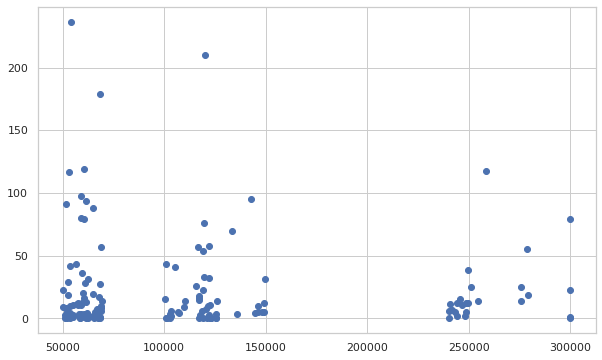

In [89]:
plt.figure(figsize=(10,6))
plt.scatter(new_df.salary,new_df.eigenvector)

In [90]:
e_r = pd.DataFrame(np.corrcoef(new_df.salary,new_df.Degree))
e_r

,0,1
0,1.000000,-0.064196
1,-0.064196,1.000000


**--------STATUS VS DEGREE CENTRALITY**

<Figure size 3600x3600 with 0 Axes>

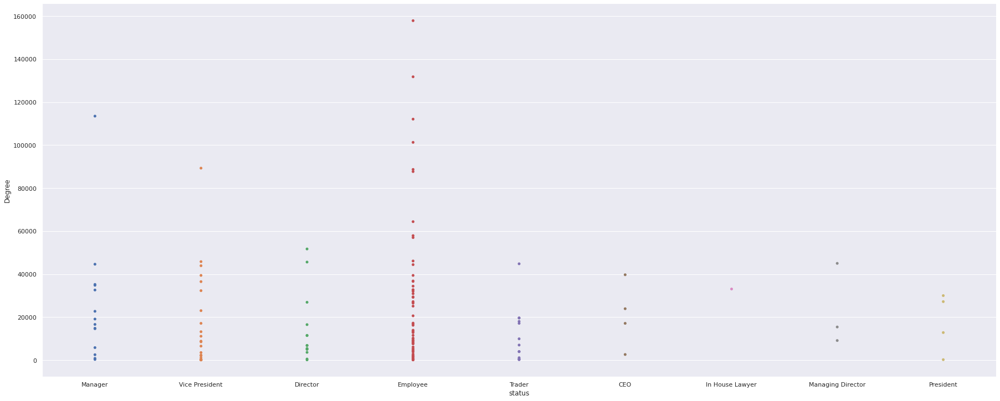

In [103]:
plt.figure(figsize=(50,50))
sns.catplot(x = new_df.status,y = new_df.Degree,jitter=False,data = new_df,height=10,aspect=10/4)

**-------STATUS VS EIGENVECTOR CENTRALITY**

<Figure size 3600x3600 with 0 Axes>

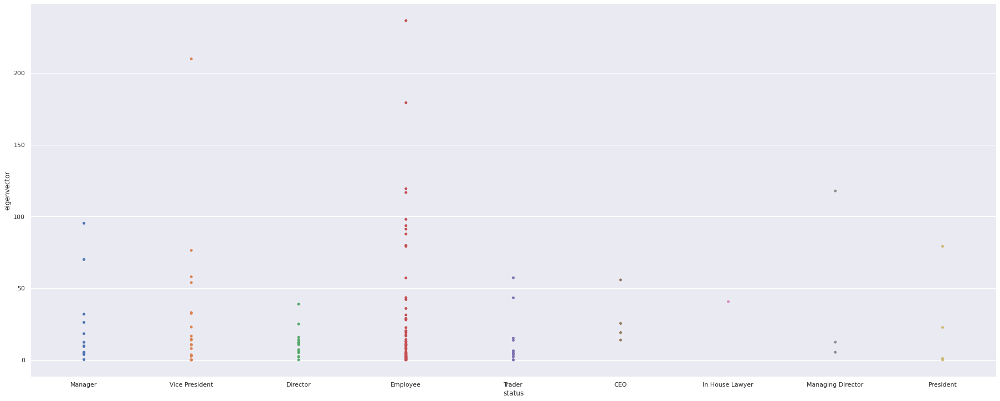

In [102]:
plt.figure(figsize=(50,50))
sns.catplot(x = new_df.status,y= new_df.eigenvector,jitter=False,data = new_df,height=10,aspect=10/4)

**-----PROPORTIONS OF PEOPLE IN NETWORKING FROM DIFFERENT STATUSES IN COMPANY**

In [93]:
def avg_cal(metric):
    
    
    
    managers = new_df[new_df["status"]=="Manager"][metric].mean()
    v_presiden = new_df[new_df["status"]=="Vice President"][metric].mean()
    director = new_df[new_df["status"]=="Director"][metric].mean()
    employee = new_df[new_df["status"]=="Employee"][metric].mean()
    trader = new_df[new_df["status"]=="Trader"][metric].mean()
    ceo = new_df[new_df["status"]=="CEO"][metric].mean()
    lawyer = new_df[new_df["status"]=="In House Lawyer"][metric].mean()
    m_dir = new_df[new_df["status"]=="Managing Director"][metric].mean()
    president = new_df[new_df["status"]=="President"][metric].mean()
    averages = np.array([managers,v_presiden,director,employee,trader,ceo,lawyer,m_dir,president])
    
        
    return averages

**-----PROPORTIONS IN DEGREE AND EGIENVECTOR CENTRALITIES OF DIFFERENT STATUSES**

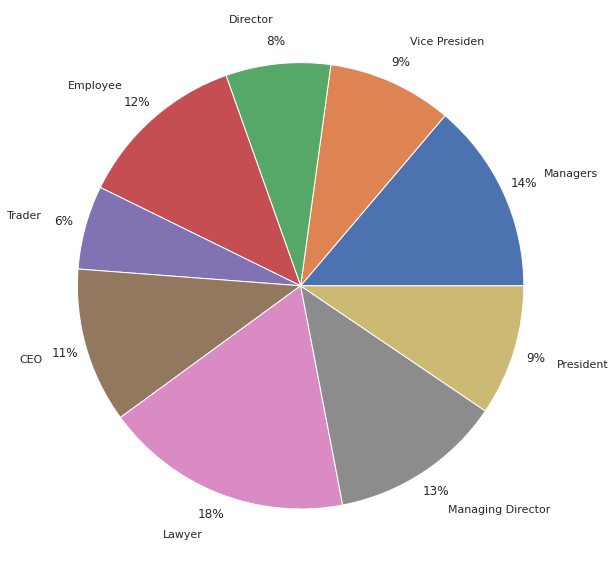

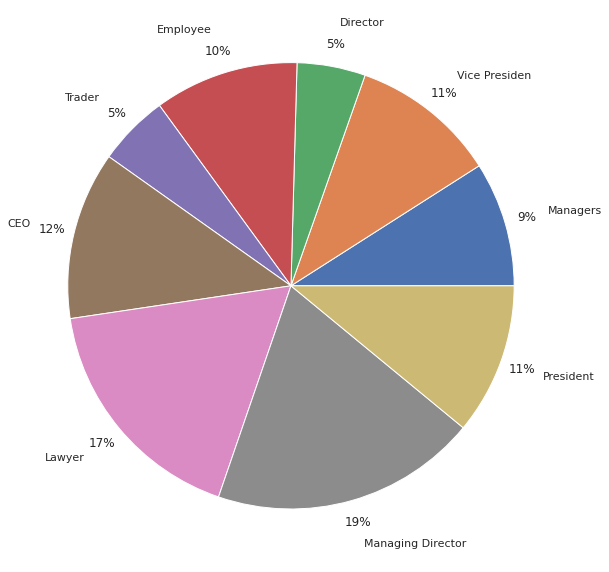

In [94]:
mylabels = ["Managers","Vice Presiden","Director","Employee","Trader","CEO","Lawyer","Managing Director","President"]
average_degree = avg_cal("Degree")
average_eigen = avg_cal("eigenvector")
sns.set_theme()
plt.figure(figsize=(10,20))
plt.pie(average_degree, labels = mylabels, autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.show()

sns.set_theme()
plt.figure(figsize=(10,20))

plt.pie(average_eigen, labels = mylabels, autopct='%1.0f%%', pctdistance=1.1, labeldistance=1.2)
plt.show()

# CLUSTERING AND PLOTTING IN 2D

In [144]:
cluster_Df = new_df[["status","Degree","salary","eigenvector"]]

ENCODING ROLES

In [145]:
le = preprocessing.LabelEncoder()
le.fit(cluster_Df["status"])
cluster_Df["status"] = le.transform(cluster_Df["status"])

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


SCALING VARIABLES FOR PCA

In [146]:
scaler = StandardScaler()
scaler.fit(cluster_Df)
cluster_Df = pd.DataFrame(scaler.transform(cluster_Df))

In [147]:
cluster_Df

,0,1,2,3
0,0.171038,0.094009,0.036611,-0.115698
1,0.171038,0.916214,0.267887,1.254241
2,1.749849,-0.720687,0.154464,-0.506443
3,-1.013070,-0.502934,1.867963,-0.278173
4,-0.618368,-0.746967,-0.724198,-0.556303
...,...,...,...,...
145,-0.618368,-0.675635,-0.673992,-0.569283
146,-0.618368,0.015168,-0.794576,-0.268357
147,1.355146,-0.082446,-0.097556,-0.485847
148,1.749849,-0.439110,0.066701,0.828533


REDUCE DIMENSION TO 2D FOR VISUALIZING 

In [148]:
pca = PCA(2)
 
#Transform the data
cluster_Df = pca.fit_transform(cluster_Df)
 

K-MEANS CLUSTERING WITH 3 CLUSTERS

In [151]:
from sklearn.cluster import KMeans
 
#Initialize the class object
kmeans = KMeans(n_clusters= 4,random_state = 42)
 
#predict the labels of clusters.
label = kmeans.fit_predict(cluster_Df)

VISUALIZE THE CLUSTERS

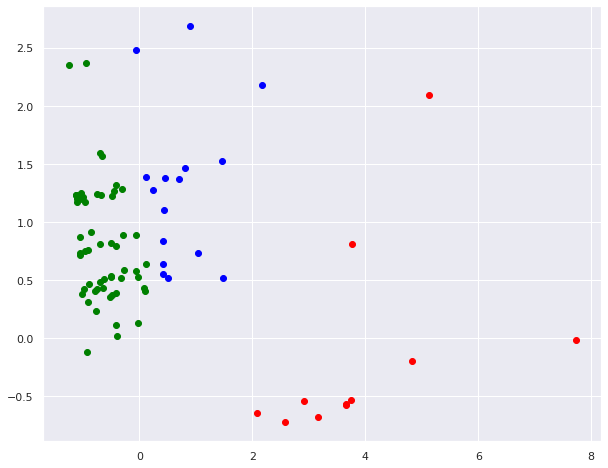

In [156]:

filtered_label1 = cluster_Df[label == 1]
 
filtered_label2 = cluster_Df[label == 2]

filtered_label3 = cluster_Df[label == 3]





 
#Plotting the results
plt.figure(figsize = (10,8))
plt.scatter(filtered_label1[:,0] , filtered_label1[:,1] , color = 'red')
plt.scatter(filtered_label2[:,0] , filtered_label2[:,1] , color = 'blue')
plt.scatter(filtered_label3[:,0] , filtered_label3[:,1] , color = 'green')


plt.show()